In [1]:
import numpy as np
import matplotlib.pyplot as plt
import Gap_dir as Ga
import waveform_zxy as wf
import fisher as fh

#先给一些常数
M_sun = 1.99*1e30
pc = 30.8396*1e15
C = 3*1e8
cG = 6.67*1e-11
pi = np.pi

#这里直接给以秒为单位的情况
C       = 299792458.         # m/s
YEAR    = 3.15581497632e7    # sec
TSUN    = 4.92549232189886339689643862e-6 # mass of sun in seconds (G=C=1)
MPC     = 3.08568025e22/C    # mega-Parsec in seconds

#波形的参数
f1 = [0,1.5251 , 0.6000 , 1.8956 , 2.3000]
f2 = [0,-1.1568 , -0.2339 , -1.3043 , -1.5056]
f3 = [0,0.1292, 0.4175, 0.1818, 0.2244]
q1 = [0,0.7, -0.3, 0.9, 1.1929]
q2 = [0,1.4187, 2.3561, 2.3430, 3.1191]
q3 = [0,-0.4990, -0.2277, -0.4810, -0.4825]

#这个是红移到光度距离的转化，对应的单位是MPC
H0 = 67.4  #（哈勃常数） 
Ωm = 0.315 #（物质密度参数） 
ΩΛ = 0.685 #（暗能密度参数）
c0=299792.458
from scipy import integrate
import math
def E(z):
    return 1/math.sqrt(Ωm*(1+z)**3+ΩΛ)

def DL(z):
    v,err=integrate.quad(E,0,z)
    return (1+z)*c0/H0*v

print(DL(1))

#针对天琴的，因为取的天琴的omega
########################发现这个转移频率，好像对波形的绝对值，没有什么影响，赢，那就是说联合观测波形不用管咯
wtq = 1.99*1e-5
#我猜这里的w就是S(f)中的频率
def Ib_p(w,wlm,tlm,phid ,philm = pi/3):
    #wtq 是天琴的rotation frequency
    #这是第一个22模式
    #phid = phid + pi/4  #原文要求带入此数值
    #这一部分，与原文对比过，代码上是一致的
    Ib1_1 = 2*tlm[0] *wtq*(tlm[0]**2 *(w**2 + wlm[0]**2 -4*wtq**2) - 2*1j*w*tlm[0] - 1)*np.cos(2*phid) - \
        (1+1j*w*tlm[0])*(tlm[0]**2*(w**2 - wlm[0]**2 - 4*wtq**2) - 2j * w *tlm[0] - 1)*np.sin(2*phid)
    Ib2_1 = (tlm[0]**2*(w**2 - wlm[0]**2 + 4*wtq**2) - 2j*w*tlm[0] - 1)*np.sin(2*phid)+\
        4*tlm[0]*wtq*(1+1j*w*tlm[0])*np.cos(2*phid)
    Ib3_1 = (tlm[0]*(w-wlm[0]-2*wtq) - 1j)*(tlm[0]*(w + wlm[0] -2*wtq)-1j)*(tlm[0]*(w-wlm[0]+2*wtq)-1j)*(tlm[0]*(w+wlm[0]+2*wtq)-1j)
    Ib_22 = (Ib1_1 * np.cos(philm) - Ib2_1 * tlm[0] * wlm[0] *np.sin(philm))*tlm[0]/Ib3_1
    #这是第二个21模式
    Ib1_2 = 2*tlm[1] *wtq*(tlm[1]**2 *(w**2 + wlm[1]**2 -4*wtq**2) - 2*1j*w*tlm[1] - 1)*np.cos(2*phid) - \
        (1+1j*w*tlm[1])*(tlm[1]**2*(w**2 - wlm[1]**2 - 4*wtq**2) - 2j * w *tlm[1] - 1)*np.sin(2*phid)
    Ib2_2 = (tlm[1]**2*(w**2 - wlm[1]**2 + 4*wtq**2) - 2j*w*tlm[1] - 1)*np.sin(2*phid)+\
        4*tlm[1]*wtq*(1+1j*w*tlm[1])*np.cos(2*phid)
    Ib3_2 = (tlm[1]*(w-wlm[1]-2*wtq) - 1j)*(tlm[1]*(w + wlm[1] -2*wtq)-1j)*(tlm[1]*(w-wlm[1]+2*wtq)-1j)*(tlm[1]*(w+wlm[1]+2*wtq)-1j)
    Ib_21 = (Ib1_2 * np.cos(philm) - Ib2_2 * tlm[1] * wlm[1] *np.sin(philm))*tlm[1]/Ib3_2
    #这是第三个33模式
    Ib1_3 = 2*tlm[2] *wtq*(tlm[2]**2 *(w**2 + wlm[2]**2 -4*wtq**2) - 2*1j*w*tlm[2] - 1)*np.cos(2*phid) - \
        (1+1j*w*tlm[2])*(tlm[2]**2*(w**2 - wlm[2]**2 - 4*wtq**2) - 2j * w *tlm[2] - 1)*np.sin(2*phid)
    Ib2_3 = (tlm[2]**2*(w**2 - wlm[2]**2 + 4*wtq**2) - 2j*w*tlm[2] - 1)*np.sin(2*phid)+\
        4*tlm[2]*wtq*(1+1j*w*tlm[2])*np.cos(2*phid)
    Ib3_3 = (tlm[2]*(w-wlm[2]-2*wtq) - 1j)*(tlm[2]*(w + wlm[2] -2*wtq)-1j)*(tlm[2]*(w-wlm[2]+2*wtq)-1j)*(tlm[2]*(w+wlm[2]+2*wtq)-1j)
    Ib_33 = (Ib1_3 * np.cos(philm) - Ib2_3 * tlm[2] * wlm[2] *np.sin(philm))*tlm[2]/Ib3_3
    #这是第四个44模式
    Ib1_4 = 2*tlm[3] *wtq*(tlm[3]**2 *(w**2 + wlm[3]**2 -4*wtq**2) - 2*1j*w*tlm[3] - 1)*np.cos(2*phid) - \
        (1+1j*w*tlm[3])*(tlm[3]**2*(w**2 - wlm[3]**2 - 4*wtq**2) - 2j * w *tlm[3] - 1)*np.sin(2*phid)
    Ib2_4 = (tlm[3]**2*(w**2 - wlm[3]**2 + 4*wtq**2) - 2j*w*tlm[3] - 1)*np.sin(2*phid)+\
        4*tlm[3]*wtq*(1+1j*w*tlm[3])*np.cos(2*phid)
    Ib3_4 = (tlm[3]*(w-wlm[3]-2*wtq) - 1j)*(tlm[3]*(w + wlm[3] -2*wtq)-1j)*(tlm[3]*(w-wlm[3]+2*wtq)-1j)*(tlm[3]*(w+wlm[3]+2*wtq)-1j)
    Ib_44 = (Ib1_4 * np.cos(philm) - Ib2_4 * tlm[3] * wlm[3] *np.sin(philm))*tlm[3]/Ib3_4

    return Ib_22,Ib_21,Ib_33,Ib_44


#现在定义与cross缩并的Ib：
def Ib_c(w,wlm,tlm,phid , philm = pi/3):
    #wtq 是天琴的rotation frequency
    #这是第一个22模式
    #phid = phid + pi/4  #原文要求带入此数值
    philm = philm - pi/2
    #这一部分，与原文对比过，代码上是一致的
    Ib1_1 = 2*tlm[0] *wtq*(tlm[0]**2 *(w**2 + wlm[0]**2 -4*wtq**2) - 2*1j*w*tlm[0] - 1)*np.cos(2*phid) - \
        (1+1j*w*tlm[0])*(tlm[0]**2*(w**2 - wlm[0]**2 - 4*wtq**2) - 2j * w *tlm[0] - 1)*np.sin(2*phid)
    Ib2_1 = (tlm[0]**2*(w**2 - wlm[0]**2 + 4*wtq**2) - 2j*w*tlm[0] - 1)*np.sin(2*phid)+\
        4*tlm[0]*wtq*(1+1j*w*tlm[0])*np.cos(2*phid)
    Ib3_1 = (tlm[0]*(w-wlm[0]-2*wtq) - 1j)*(tlm[0]*(w + wlm[0] -2*wtq)-1j)*(tlm[0]*(w-wlm[0]+2*wtq)-1j)*(tlm[0]*(w+wlm[0]+2*wtq)-1j)
    Ib_22 = (Ib1_1 * np.cos(philm) - Ib2_1 * tlm[0] * wlm[0] *np.sin(philm))*tlm[0]/Ib3_1
    #这是第二个21模式
    Ib1_2 = 2*tlm[1] *wtq*(tlm[1]**2 *(w**2 + wlm[1]**2 -4*wtq**2) - 2*1j*w*tlm[1] - 1)*np.cos(2*phid) - \
        (1+1j*w*tlm[1])*(tlm[1]**2*(w**2 - wlm[1]**2 - 4*wtq**2) - 2j * w *tlm[1] - 1)*np.sin(2*phid)
    Ib2_2 = (tlm[1]**2*(w**2 - wlm[1]**2 + 4*wtq**2) - 2j*w*tlm[1] - 1)*np.sin(2*phid)+\
        4*tlm[1]*wtq*(1+1j*w*tlm[1])*np.cos(2*phid)
    Ib3_2 = (tlm[1]*(w-wlm[1]-2*wtq) - 1j)*(tlm[1]*(w + wlm[1] -2*wtq)-1j)*(tlm[1]*(w-wlm[1]+2*wtq)-1j)*(tlm[1]*(w+wlm[1]+2*wtq)-1j)
    Ib_21 = (Ib1_2 * np.cos(philm) - Ib2_2 * tlm[1] * wlm[1] *np.sin(philm))*tlm[1]/Ib3_2
    #这是第三个33模式
    Ib1_3 = 2*tlm[2] *wtq*(tlm[2]**2 *(w**2 + wlm[2]**2 -4*wtq**2) - 2*1j*w*tlm[2] - 1)*np.cos(2*phid) - \
        (1+1j*w*tlm[2])*(tlm[2]**2*(w**2 - wlm[2]**2 - 4*wtq**2) - 2j * w *tlm[2] - 1)*np.sin(2*phid)
    Ib2_3 = (tlm[2]**2*(w**2 - wlm[2]**2 + 4*wtq**2) - 2j*w*tlm[2] - 1)*np.sin(2*phid)+\
        4*tlm[2]*wtq*(1+1j*w*tlm[2])*np.cos(2*phid)
    Ib3_3 = (tlm[2]*(w-wlm[2]-2*wtq) - 1j)*(tlm[2]*(w + wlm[2] -2*wtq)-1j)*(tlm[2]*(w-wlm[2]+2*wtq)-1j)*(tlm[2]*(w+wlm[2]+2*wtq)-1j)
    Ib_33 = (Ib1_3 * np.cos(philm) - Ib2_3 * tlm[2] * wlm[2] *np.sin(philm))*tlm[2]/Ib3_3
    #这是第四个44模式
    Ib1_4 = 2*tlm[3] *wtq*(tlm[3]**2 *(w**2 + wlm[3]**2 -4*wtq**2) - 2*1j*w*tlm[3] - 1)*np.cos(2*phid) - \
        (1+1j*w*tlm[3])*(tlm[3]**2*(w**2 - wlm[3]**2 - 4*wtq**2) - 2j * w *tlm[3] - 1)*np.sin(2*phid)
    Ib2_4 = (tlm[3]**2*(w**2 - wlm[3]**2 + 4*wtq**2) - 2j*w*tlm[3] - 1)*np.sin(2*phid)+\
        4*tlm[3]*wtq*(1+1j*w*tlm[3])*np.cos(2*phid)
    Ib3_4 = (tlm[3]*(w-wlm[3]-2*wtq) - 1j)*(tlm[3]*(w + wlm[3] -2*wtq)-1j)*(tlm[3]*(w-wlm[3]+2*wtq)-1j)*(tlm[3]*(w+wlm[3]+2*wtq)-1j)
    Ib_44 = (Ib1_4 * np.cos(philm) - Ib2_4 * tlm[3] * wlm[3] *np.sin(philm))*tlm[3]/Ib3_4

    return Ib_22,Ib_21,Ib_33,Ib_44

#这里给出天琴探测器响应后的频域波形
#没准在这里给出一些参数，将Ib_p确定下来

gamma = pi/3
thetad = 1.17662
psid = -0.873302
phid = -0.615727
#Mz = M 
#Dl = r

'''
#这里是频率下的波形
def sf(freq):
    phid1 = phid
    phid2 = phid +pi/4
    freq = freq*2*pi #将圆频率转化到频率
    #这一部分已与原文对比，形式上没有问题
    sig_freq_22 = (-0.5*np.sin(gamma)*(1+np.cos(thetad)**2)*np.cos(2*psid)*Ib_p(freq,wlm,tlm,phid1)[0]+\
                np.sin(gamma)*np.cos(thetad)*np.sin(2*psid)*Ib_p(freq,wlm,tlm,phid2)[0])*Mz*A1*Yp1/Dl +\
                (0.5*np.sin(gamma)*(1+np.cos(thetad)**2)*np.sin(2*psid)*Ib_c(freq,wlm,tlm,phid1)[0]+\
                np.sin(gamma)*np.cos(thetad)*np.cos(2*psid)*Ib_c(freq,wlm,tlm,phid2)[0])*Mz*A1*Yc1/Dl
    
    sig_freq_21 = (-0.5*np.sin(gamma)*(1+np.cos(thetad)**2)*np.cos(2*psid)*Ib_p(freq,wlm,tlm,phid1)[1]+\
                np.sin(gamma)*np.cos(thetad)*np.sin(2*psid)*Ib_p(freq,wlm,tlm,phid2)[1])*Mz*A2*Yp2/Dl +\
                (0.5*np.sin(gamma)*(1+np.cos(thetad)**2)*np.sin(2*psid)*Ib_c(freq,wlm,tlm,phid1)[1]+\
                np.sin(gamma)*np.cos(thetad)*np.cos(2*psid)*Ib_c(freq,wlm,tlm,phid2)[1])*Mz*A2*Yc2/Dl
    
    sig_freq_33 = (-0.5*np.sin(gamma)*(1+np.cos(thetad)**2)*np.cos(2*psid)*Ib_p(freq,wlm,tlm,phid1)[2]+\
                np.sin(gamma)*np.cos(thetad)*np.sin(2*psid)*Ib_p(freq,wlm,tlm,phid2)[2])*Mz*A3*Yp3/Dl +\
                (0.5*np.sin(gamma)*(1+np.cos(thetad)**2)*np.sin(2*psid)*Ib_c(freq,wlm,tlm,phid1)[2]+\
                np.sin(gamma)*np.cos(thetad)*np.cos(2*psid)*Ib_c(freq,wlm,tlm,phid2)[2])*Mz*A3*Yc3/Dl
    
    sig_freq_44 = (-0.5*np.sin(gamma)*(1+np.cos(thetad)**2)*np.cos(2*psid)*Ib_p(freq,wlm,tlm,phid1)[3]+\
                np.sin(gamma)*np.cos(thetad)*np.sin(2*psid)*Ib_p(freq,wlm,tlm,phid2)[3])*Mz*A4*Yp4/Dl +\
                (0.5*np.sin(gamma)*(1+np.cos(thetad)**2)*np.sin(2*psid)*Ib_c(freq,wlm,tlm,phid1)[3]+\
                np.sin(gamma)*np.cos(thetad)*np.cos(2*psid)*Ib_c(freq,wlm,tlm,phid2)[3])*Mz*A4*Yc4/Dl
    return sig_freq_22+sig_freq_21+sig_freq_33+sig_freq_44
'''
def fin(Mass,massratio):
    M = Mass * TSUN
    mass_ratio = massratio
    eta = mass_ratio/(1+mass_ratio)**2   #eta为对称质量比
    j = eta*(2*np.sqrt(3)-3.5171*eta+2.5763*eta**2)

    ################################################################
    w1 = (f1[1] + f2[1]*(1-j)**f3[1])/M ; dw1 = 0
    w2 = (f1[2] + f2[2]*(1-j)**f3[2])/M ; dw2 = 0
    w3 = (f1[3] + f2[3]*(3-j)**f3[3])/M ; dw3 = 0
    w4 = (f1[4] + f2[4]*(4-j)**f3[4])/M ; dw4 = 0
    tau1 = 2*(q1[1]+q2[1]*(1-j)**q3[1])/w1 ; dtau1 = 0
    tau2 = 2*(q1[2]+q2[2]*(1-j)**q3[2])/w2 ; dtau2 = 0
    tau3 = 2*(q1[3]+q2[3]*(1-j)**q3[3])/w3 ; dtau3 = 0
    tau4 = 2*(q1[4]+q2[4]*(1-j)**q3[4])/w4 ; dtau4 = 0
    #return max(0.5*w2/(2*pi),2*1e-5)
    
    return 0.5*w2/(2*pi)

def fout(Mass,massratio):
    M = Mass * TSUN
    mass_ratio = massratio
    eta = mass_ratio/(1+mass_ratio)**2   #eta为对称质量比
    j = eta*(2*np.sqrt(3)-3.5171*eta+2.5763*eta**2)

    ################################################################
    w1 = (f1[1] + f2[1]*(1-j)**f3[1])/M ; dw1 = 0
    w2 = (f1[2] + f2[2]*(1-j)**f3[2])/M ; dw2 = 0
    w3 = (f1[3] + f2[3]*(3-j)**f3[3])/M ; dw3 = 0
    w4 = (f1[4] + f2[4]*(4-j)**f3[4])/M ; dw4 = 0
    tau1 = 2*(q1[1]+q2[1]*(1-j)**q3[1])/w1 ; dtau1 = 0
    tau2 = 2*(q1[2]+q2[2]*(1-j)**q3[2])/w2 ; dtau2 = 0
    tau3 = 2*(q1[3]+q2[3]*(1-j)**q3[3])/w3 ; dtau3 = 0
    tau4 = 2*(q1[4]+q2[4]*(1-j)**q3[4])/w4 ; dtau4 = 0
    return 2*(w4/2/pi)

def sf(freq,paramater,delta_w,delta_tau,iot = pi/4):
    M = paramater[0] * TSUN
    Mz = M
    mass_ratio = paramater[1]
    r = DL(paramater[2]) * MPC
    Dl = r


    dw1,dw2,dw3,dw4 = delta_w[0],delta_w[1],delta_w[2],delta_w[3]
    dtau1,dtau2,dtau3,dtau4 = delta_tau[0],delta_tau[1],delta_tau[2],delta_tau[3]


    dM = 0
    t0 = 0
    dr = 0
    phi = 0

    #这里放置波形一般性的所有内容
    m1=2;m2=1;m3=3;m4=4
    #这一块检查过没问题
    #四个模式的频率和衰减时间
    #这里1234，分别代表22,21,33,44模式

    #q = M1/M2 （eta>=1），因此是无量纲数，就自由取值吧

    eta = mass_ratio/(1+mass_ratio)**2   #eta为对称质量比
    j = eta*(2*np.sqrt(3)-3.5171*eta+2.5763*eta**2)

    ################################################################
    w1 = (f1[1] + f2[1]*(1-j)**f3[1])/M *(1+dw1); 
    w2 = (f1[2] + f2[2]*(1-j)**f3[2])/M *(1+dw2); 
    w3 = (f1[3] + f2[3]*(3-j)**f3[3])/M *(1+dw3); 
    w4 = (f1[4] + f2[4]*(4-j)**f3[4])/M *(1+dw4); 
    tau1 = 2*(q1[1]+q2[1]*(1-j)**q3[1])/w1 *(1+dtau1); 
    tau2 = 2*(q1[2]+q2[2]*(1-j)**q3[2])/w2 *(1+dtau2); 
    tau3 = 2*(q1[3]+q2[3]*(1-j)**q3[3])/w3 *(1+dtau3); 
    tau4 = 2*(q1[4]+q2[4]*(1-j)**q3[4])/w4 *(1+dtau4); 
    wlm = np.array([w1,w2,w3,w4])
    tlm = np.array([tau1,tau2,tau3,tau4])

    #四个模式的振幅,现在进行定义非自旋amplitude,参考文章： PHYS.REV.D97,044048(2018)
    A1 = eta*0.571+0.303#22
    A2 = eta*0.099+0.06#21
    A3 = eta*0.157+0.671#33
    A4 = 0.122 -0.188*eta -0.964*eta**2#44

    #球谐函数，检查过没问题
    iot=pi/4
    Yp1 = np.sqrt(5/(4*pi)) * (1+np.cos(iot)**2)/2 #22
    Yp2 = np.sqrt(5/(4*pi)) * np.sin(iot) #21
    Yp3 = -np.sqrt(21/(8*pi)) * (1+np.cos(iot)**2) * np.sin(iot) / 2 #33
    Yp4 = np.sqrt(63/(16*pi))*(1+np.cos(iot)**2) * np.sin(iot)**2/2 #44
    Yc1 = np.sqrt(5/(4*pi)) * np.cos(iot)
    Yc2 = np.sqrt(5/(4*pi)) * np.cos(iot) * np.sin(iot)
    Yc3 = -np.sqrt(21/(8*pi)) * np.cos(iot) * np.sin(iot)
    Yc4 = np.sqrt(63/(16*pi))* np.cos(iot) * np.sin(iot)**2

    phid1 = phid
    phid2 = phid +pi/4
    
    freq = freq*2*pi #将圆频率转化到频率
    #这一部分已与原文对比，形式上没有问题
    sig_freq_22 = (-0.5*np.sin(gamma)*(1+np.cos(thetad)**2)*np.cos(2*psid)*Ib_p(freq,wlm,tlm,phid1)[0]+\
                np.sin(gamma)*np.cos(thetad)*np.sin(2*psid)*Ib_p(freq,wlm,tlm,phid2)[0])*Mz*A1*Yp1/Dl +\
                (0.5*np.sin(gamma)*(1+np.cos(thetad)**2)*np.sin(2*psid)*Ib_c(freq,wlm,tlm,phid1)[0]+\
                np.sin(gamma)*np.cos(thetad)*np.cos(2*psid)*Ib_c(freq,wlm,tlm,phid2)[0])*Mz*A1*Yc1/Dl
    
    sig_freq_21 = (-0.5*np.sin(gamma)*(1+np.cos(thetad)**2)*np.cos(2*psid)*Ib_p(freq,wlm,tlm,phid1)[1]+\
                np.sin(gamma)*np.cos(thetad)*np.sin(2*psid)*Ib_p(freq,wlm,tlm,phid2)[1])*Mz*A2*Yp2/Dl +\
                (0.5*np.sin(gamma)*(1+np.cos(thetad)**2)*np.sin(2*psid)*Ib_c(freq,wlm,tlm,phid1)[1]+\
                np.sin(gamma)*np.cos(thetad)*np.cos(2*psid)*Ib_c(freq,wlm,tlm,phid2)[1])*Mz*A2*Yc2/Dl
    
    sig_freq_33 = (-0.5*np.sin(gamma)*(1+np.cos(thetad)**2)*np.cos(2*psid)*Ib_p(freq,wlm,tlm,phid1)[2]+\
                np.sin(gamma)*np.cos(thetad)*np.sin(2*psid)*Ib_p(freq,wlm,tlm,phid2)[2])*Mz*A3*Yp3/Dl +\
                (0.5*np.sin(gamma)*(1+np.cos(thetad)**2)*np.sin(2*psid)*Ib_c(freq,wlm,tlm,phid1)[2]+\
                np.sin(gamma)*np.cos(thetad)*np.cos(2*psid)*Ib_c(freq,wlm,tlm,phid2)[2])*Mz*A3*Yc3/Dl
    
    sig_freq_44 = (-0.5*np.sin(gamma)*(1+np.cos(thetad)**2)*np.cos(2*psid)*Ib_p(freq,wlm,tlm,phid1)[3]+\
                np.sin(gamma)*np.cos(thetad)*np.sin(2*psid)*Ib_p(freq,wlm,tlm,phid2)[3])*Mz*A4*Yp4/Dl +\
                (0.5*np.sin(gamma)*(1+np.cos(thetad)**2)*np.sin(2*psid)*Ib_c(freq,wlm,tlm,phid1)[3]+\
                np.sin(gamma)*np.cos(thetad)*np.cos(2*psid)*Ib_c(freq,wlm,tlm,phid2)[3])*Mz*A4*Yc4/Dl
    

    return sig_freq_22+sig_freq_21+sig_freq_33+sig_freq_44

def PowerSpectralDensity(f):
    
    """
    From https://arxiv.org/pdf/1803.01944.pdf. 
    """
    #这里现在使用天琴的参数
    L = np.sqrt(3)*10**8   # Length of LISA arm
    f0 = 0.27547374120820667
    
    Poms = ((1.*10**-12)**2)*(1 + ((2*10**-3)/f)**4)  # Optical Metrology Sensor
    Pacc = (1.*10**-15)**2*(1 + (4*10**-3/(10*f))**2)*(1 + (f/(8*10**-3))**4)  # Acceleration Noise
    #Sc = 9*10**(-45)*f**(-7/3)*np.exp(-f**0.171 + 292*f*np.sin(1020*f)) * (1 \
    #                                        + np.tanh(1680*(0.00215 - f)))   # Confusion noise
    alpha = 0.171
    beta = 292
    k =1020
    gamma = 1680
    f_k = 0.00215 
    PSD = ((10/(3*L*L))*(Poms + (4*Pacc)/(np.power(2*np.pi*f,4)))*(1 + 0.6*(f/f0)*(f/f0)) ) # PSD
        
    # Handling the zeroth frequency bin
    
    where_are_NaNs = np.isnan(PSD) 
    PSD[where_are_NaNs] = 1e100    # at f = 0, PSD is infinite. Approximate infinity and burn my 
                                   # mathematics degree to the ground. 
    
    return PSD

def inner_prod(sig1_f,sig2_f,PSD,delta_f):
    """
    Inputs:
    sig1_f, sig2_f are continuous time fourier transforms with dimensions of seconds.
    PSD (power spectral density) defined in the function below. 
    delta_f : spacing of fourier frequencies
    
    outputs: Standard inner product, dimensionless.
    """
    return (4*delta_f)  * np.real(sum(sig1_f*np.conjugate(sig2_f)/PSD))

6802.525834693799
6802.525834693799


In [5]:
randnum = 0
def win(peri,htime,Tvec):
    #注意，这里可能需要将gap的位置避免放置在ringdown信号的边缘
    #np.random.seed(1)
    #posi_gap = peri * np.random.uniform(0,1,1)
    posi_gap = peri * randnum
    #posi_gap = peri * uni_rand
    #posi_gap = 2000
    Tgap = peri/10
    Ts = posi_gap - Tgap
    Te = posi_gap + Tgap
    Tr = peri/10
    gap_st = htime[:]

    for nn in range(len(Tvec)):
        
        if nn >=Ts and nn <= Te:
            
            gap_st[nn] = 0
        elif nn <Ts and nn >= Ts-Tr:
            gap_st[nn] = gap_st[nn]*0.5*(1+np.cos(pi*(nn-Ts-Tr)/Tr))
            
        elif nn >Te and nn <= Te+Tr:
            gap_st[nn] = gap_st[nn]*0.5*(1+np.cos(pi*(nn-Te-Tr)/Tr))

    print("完成加窗过程，窗的长度为：",Tgap)
    return gap_st

In [7]:
#现在结合前面，直接得到加了随机位置gap的频域信号
#这里的频率，要给全频域的频率，return 的为仅ringdown阶段的频谱
def get_gap_sf(gp_freq,params,para_dw=[0,0,0,0],para_dtau=[0,0,0,0]):
    nogap_sf = sf(gp_freq,params,para_dw,para_dtau)
    gp_st=Ga.Freq_ifft(nogap_sf)
    #gp = get_gap
    gp_M0 = params[0]
    gp_M = gp_M0*TSUN
    gp_Mratio = params[1]
    gp_eta = gp_Mratio/(1+gp_Mratio)**2

    gp_j = gp_eta*(2*np.sqrt(3)-3.5171*gp_eta+2.5763*gp_eta**2)

    gp_w4 = (f1[4] + f2[4]*(4-gp_j)**f3[4])/gp_M 
    gp_tau4 = 2*(q1[4]+q2[4]*(1-gp_j)**q3[4])/gp_w4 
    
    gp_period = gp_tau4*2*pi
    gp_time = np.arange(0,len(nogap_sf),1)

    gp_gaped_st = win(gp_period,gp_st,gp_time)

    gp_sf_full = sf(gp_freq,params,para_dw,para_dtau)
    gp_sf_gap = Ga.Time_fft(gp_sf_full,gp_gaped_st)
    
    gp_fi = fin(gp_M0,gp_Mratio)
    gp_fe = fout(gp_M0,gp_Mratio)
    gp_n_rd = []
    for nn in range(len(gp_freq)):
        if gp_freq[nn]>=gp_fi :
            if gp_freq[nn]<=gp_fe:
                gp_n_rd.append(nn)
    print(gp_n_rd)
    gp_ns = gp_n_rd[0]
    gp_ne = gp_n_rd[-1]
    gp_freq_rd_gap = gp_freq[gp_ns:gp_ne]
    gp_sf_rd_gap = gp_sf_gap[gp_ns:gp_ne]
    gp_sf_rd_full = gp_sf_full[gp_ns:gp_ne]

    return gp_freq_rd_gap,gp_sf_rd_full,gp_sf_rd_gap

In [8]:
def cbtst_fisher(Mtotw,M_ratiow,R_shiftw):
   
   np.random.seed(123)
   randnum = .15
   delta_w = [0,0,0,0]
   delta_tau = [0,0,0,0]
   para_dw = delta_w
   f_ini = fin(Mtotw,M_ratiow)
   f_end = fout(Mtotw,M_ratiow)
   freq = np.arange(1e-5,1,1e-5)
   freq_rd = np.arange(f_ini,f_end,1e-5)

   para_dtau = delta_tau
   params_1_p = [Mtotw,M_ratiow,R_shiftw]
   params_1_m = [Mtotw,M_ratiow,R_shiftw]
   mode_delta = 1e-3   #懒得改了，这里所有的delta都用22表示把
   omega = delta_w[:]
   omega[0] = omega[0]+mode_delta
   delta_w22_p = omega
   omega = delta_w[:]
   omega[0] = omega[0]-mode_delta
   delta_w22_m = omega
   deriv_w22 = (np.array(get_gap_sf(freq,params_1_p,delta_w22_p,para_dtau)[2]) - np.array(get_gap_sf(freq,params_1_m,delta_w22_m,para_dtau)[2]))/(2* mode_delta)


   mode_delta = 1e-3   #懒得改了，这里所有的delta都用22表示把
   omega = delta_w[:]
   omega[1] = omega[1]+mode_delta
   delta_w22_p = omega
   omega = delta_w[:]
   omega[1] = omega[1]-mode_delta
   delta_w22_m = omega
   deriv_w21 = (np.array(get_gap_sf(freq,params_1_p,delta_w22_p,para_dtau)[2]) - np.array(get_gap_sf(freq,params_1_m,delta_w22_m,para_dtau)[2]))/(2* mode_delta)


   mode_delta = 1e-3   #懒得改了，这里所有的delta都用22表示把
   omega = delta_w[:]
   omega[2] = omega[2]+mode_delta
   delta_w22_p = omega
   omega = delta_w[:]
   omega[2] = omega[2]-mode_delta
   delta_w22_m = omega
   deriv_w33 = (np.array(get_gap_sf(freq,params_1_p,delta_w22_p,para_dtau)[2]) - np.array(get_gap_sf(freq,params_1_m,delta_w22_m,para_dtau)[2]))/(2* mode_delta)

   mode_delta = 1e-3   #懒得改了，这里所有的delta都用22表示把
   omega = delta_w[:]
   omega[3] = omega[3]+mode_delta
   delta_w22_p = omega
   omega = delta_w[:]
   omega[3] = omega[3]-mode_delta
   delta_w22_m = omega
   deriv_w44 = (np.array(get_gap_sf(freq,params_1_p,delta_w22_p,para_dtau)[2]) - np.array(get_gap_sf(freq,params_1_m,delta_w22_m,para_dtau)[2]))/(2* mode_delta)

   #这里按顺序是tau的各模式
       #22模式的w和tau:



   mode_delta = 1e-3
   tau = delta_tau[:]
   tau[0] = tau[0]+mode_delta
   delta_tau22_p = tau
   tau = delta_tau[:]
   tau[0] = tau[0]-mode_delta
   delta_tau22_m = tau
   deriv_tau22 = (np.array(get_gap_sf(freq,params_1_p,para_dw,delta_tau22_p)[2]) - np.array(get_gap_sf(freq,params_1_m,para_dw,delta_tau22_m)[2]))/(2* mode_delta)


   #21模式的w和tau:




   mode_delta = 1e-3
   tau = delta_tau[:]
   tau[1] = tau[1]+mode_delta
   delta_tau22_p = tau
   tau = delta_tau[:]
   tau[1] = tau[1]-mode_delta
   delta_tau22_m = tau
   deriv_tau21 = (np.array(get_gap_sf(freq,params_1_p,para_dw,delta_tau22_p)[2]) - np.array(get_gap_sf(freq,params_1_m,para_dw,delta_tau22_m)[2]))/(2* mode_delta)

   #33模式的w和tau:



   mode_delta = 1e-3
   tau = delta_tau[:]
   tau[2] = tau[2]+mode_delta
   delta_tau22_p = tau
   tau = delta_tau[:]
   tau[2] = tau[2]-mode_delta
   delta_tau22_m = tau
   deriv_tau33 = (np.array(get_gap_sf(freq,params_1_p,para_dw,delta_tau22_p)[2]) - np.array(get_gap_sf(freq,params_1_m,para_dw,delta_tau22_m)[2]))/(2* mode_delta)

   #44模式的w和tau:



   mode_delta = 1e-3
   tau = delta_tau[:]
   tau[3] = tau[3]+mode_delta
   delta_tau22_p = tau
   tau = delta_tau[:]
   tau[3] = tau[3]-mode_delta
   delta_tau22_m = tau
   deriv_tau44 = (np.array(get_gap_sf(freq,params_1_p,para_dw,delta_tau22_p)[2]) - np.array(get_gap_sf(freq,params_1_m,para_dw,delta_tau22_m)[2]))/(2* mode_delta)



   freq_rd = np.array(get_gap_sf(freq,params_1_p,para_dw,delta_tau22_p)[0])



   diff_vec_tq = [deriv_w22,deriv_w21,deriv_w33,deriv_w44,deriv_tau22,deriv_tau21,deriv_tau33,deriv_tau44]  # Concatenate derivatives

   N_sig = 1  # Number of signals

   N_params = len(diff_vec_tq)  # Number of parameters we care about

   K = N_sig * N_params  # Dimension of Fisher Matrix

   fish_mix_tq = np.eye(K)
   for i in range(0,K):
      for j in range(0,K):
         fish_mix_tq[i,j] = inner_prod(diff_vec_tq[i],diff_vec_tq[j],PowerSpectralDensity(freq_rd),1e-5)  # Construct Fisher Matrix


   randnum = .8
   delta_w = [0,0,0,0]
   delta_tau = [0,0,0,0]
   para_dw = delta_w
   f_ini = fin(Mtotw,M_ratiow)
   f_end = fout(Mtotw,M_ratiow)
   freq = np.arange(1e-5,1,1e-5)
   freq_rd = np.arange(f_ini,f_end,1e-5)

   para_dtau = delta_tau
   params_1_p = [Mtotw,M_ratiow,R_shiftw]
   params_1_m = [Mtotw,M_ratiow,R_shiftw]
   mode_delta = 1e-3   #懒得改了，这里所有的delta都用22表示把
   omega = delta_w[:]
   omega[0] = omega[0]+mode_delta
   delta_w22_p = omega
   omega = delta_w[:]
   omega[0] = omega[0]-mode_delta
   delta_w22_m = omega
   deriv_w22 = (np.array(get_gap_sf(freq,params_1_p,delta_w22_p,para_dtau)[2]) - np.array(get_gap_sf(freq,params_1_m,delta_w22_m,para_dtau)[2]))/(2* mode_delta)


   mode_delta = 1e-3   #懒得改了，这里所有的delta都用22表示把
   omega = delta_w[:]
   omega[1] = omega[1]+mode_delta
   delta_w22_p = omega
   omega = delta_w[:]
   omega[1] = omega[1]-mode_delta
   delta_w22_m = omega
   deriv_w21 = (np.array(get_gap_sf(freq,params_1_p,delta_w22_p,para_dtau)[2]) - np.array(get_gap_sf(freq,params_1_m,delta_w22_m,para_dtau)[2]))/(2* mode_delta)


   mode_delta = 1e-3   #懒得改了，这里所有的delta都用22表示把
   omega = delta_w[:]
   omega[2] = omega[2]+mode_delta
   delta_w22_p = omega
   omega = delta_w[:]
   omega[2] = omega[2]-mode_delta
   delta_w22_m = omega
   deriv_w33 = (np.array(get_gap_sf(freq,params_1_p,delta_w22_p,para_dtau)[2]) - np.array(get_gap_sf(freq,params_1_m,delta_w22_m,para_dtau)[2]))/(2* mode_delta)

   mode_delta = 1e-3   #懒得改了，这里所有的delta都用22表示把
   omega = delta_w[:]
   omega[3] = omega[3]+mode_delta
   delta_w22_p = omega
   omega = delta_w[:]
   omega[3] = omega[3]-mode_delta
   delta_w22_m = omega
   deriv_w44 = (np.array(get_gap_sf(freq,params_1_p,delta_w22_p,para_dtau)[2]) - np.array(get_gap_sf(freq,params_1_m,delta_w22_m,para_dtau)[2]))/(2* mode_delta)

   #这里按顺序是tau的各模式
       #22模式的w和tau:



   mode_delta = 1e-3
   tau = delta_tau[:]
   tau[0] = tau[0]+mode_delta
   delta_tau22_p = tau
   tau = delta_tau[:]
   tau[0] = tau[0]-mode_delta
   delta_tau22_m = tau
   deriv_tau22 = (np.array(get_gap_sf(freq,params_1_p,para_dw,delta_tau22_p)[2]) - np.array(get_gap_sf(freq,params_1_m,para_dw,delta_tau22_m)[2]))/(2* mode_delta)


   #21模式的w和tau:




   mode_delta = 1e-3
   tau = delta_tau[:]
   tau[1] = tau[1]+mode_delta
   delta_tau22_p = tau
   tau = delta_tau[:]
   tau[1] = tau[1]-mode_delta
   delta_tau22_m = tau
   deriv_tau21 = (np.array(get_gap_sf(freq,params_1_p,para_dw,delta_tau22_p)[2]) - np.array(get_gap_sf(freq,params_1_m,para_dw,delta_tau22_m)[2]))/(2* mode_delta)

   #33模式的w和tau:



   mode_delta = 1e-3
   tau = delta_tau[:]
   tau[2] = tau[2]+mode_delta
   delta_tau22_p = tau
   tau = delta_tau[:]
   tau[2] = tau[2]-mode_delta
   delta_tau22_m = tau
   deriv_tau33 = (np.array(get_gap_sf(freq,params_1_p,para_dw,delta_tau22_p)[2]) - np.array(get_gap_sf(freq,params_1_m,para_dw,delta_tau22_m)[2]))/(2* mode_delta)

   #44模式的w和tau:



   mode_delta = 1e-3
   tau = delta_tau[:]
   tau[3] = tau[3]+mode_delta
   delta_tau22_p = tau
   tau = delta_tau[:]
   tau[3] = tau[3]-mode_delta
   delta_tau22_m = tau
   deriv_tau44 = (np.array(get_gap_sf(freq,params_1_p,para_dw,delta_tau22_p)[2]) - np.array(get_gap_sf(freq,params_1_m,para_dw,delta_tau22_m)[2]))/(2* mode_delta)



   freq_rd = np.array(get_gap_sf(freq,params_1_p,para_dw,delta_tau22_p)[0])



   diff_vec_ls = [deriv_w22,deriv_w21,deriv_w33,deriv_w44,deriv_tau22,deriv_tau21,deriv_tau33,deriv_tau44]  # Concatenate derivatives

   N_sig = 1  # Number of signals

   N_params = len(diff_vec_ls)  # Number of parameters we care about

   K = N_sig * N_params  # Dimension of Fisher Matrix

   fish_mix_ls = np.eye(K)
   for i in range(0,K):
      for j in range(0,K):
         fish_mix_ls[i,j] = inner_prod(diff_vec_ls[i],diff_vec_ls[j],fh.psd_ls(freq_rd),1e-5)  # Construct Fisher Matrix



         

   import mpmath as mp  # Import arbitrary precision matrix
   #mp.dps表示精确度达到的位数
   mp.dps = 4000;   
   #print(fish_mix)
   fish_mix_prec = mp.matrix(fish_mix_tq)+mp.matrix(fish_mix_ls)
   #print(fish_mix_prec)
   fish_mix_inv = fish_mix_prec**-1
   #print(fish_mix_inv)

   #将这三行向量合成为一个矩阵
   Cov_Matrix = np.eye(K)
   for i in range(0,K):
      for j in range(0,K):
         Cov_Matrix[i,j] = float(fish_mix_inv[i,j])
   print(Cov_Matrix)
   print('Delta logMchirp optimal:',np.sqrt(np.diag(Cov_Matrix))[0])
   print('Delta eta optimal:',np.sqrt(np.diag(Cov_Matrix))[1])
   print('Delta beta optimal:',np.sqrt(np.diag(Cov_Matrix))[2])
   print('Delta beta optimal:',np.sqrt(np.diag(Cov_Matrix))[3])
   return np.sqrt(np.diag(Cov_Matrix))[0],np.sqrt(np.diag(Cov_Matrix))[1],np.sqrt(np.diag(Cov_Matrix))[2],np.sqrt(np.diag(Cov_Matrix))[3],\
   np.sqrt(np.diag(Cov_Matrix))[4],np.sqrt(np.diag(Cov_Matrix))[5],np.sqrt(np.diag(Cov_Matrix))[6],np.sqrt(np.diag(Cov_Matrix))[7]

In [9]:
#这里是只有quasi normal mode的计算模块
rd_M = np.logspace(5,7,5)
error_w1_gp = []
error_w2_gp = []
error_w3_gp = []
error_w4_gp = []

error_t1_gp = []
error_t2_gp = []
error_t3_gp = []
error_t4_gp = []
for nn in range(len(rd_M)):
   Mtotw = rd_M[nn]
   M_ratiow = 2
   R_shiftw = 1
   
   randnum = .15
   delta_w = [0,0,0,0]
   delta_tau = [0,0,0,0]
   para_dw = delta_w
   f_ini = fin(Mtotw,M_ratiow)
   f_end = fout(Mtotw,M_ratiow)
   freq = np.arange(1e-5,1,1e-5)
   freq_rd = np.arange(f_ini,f_end,1e-5)

   para_dtau = delta_tau
   params_1_p = [Mtotw,M_ratiow,R_shiftw]
   params_1_m = [Mtotw,M_ratiow,R_shiftw]
   mode_delta = 1e-3   #懒得改了，这里所有的delta都用22表示把
   omega = delta_w[:]
   omega[0] = omega[0]+mode_delta
   delta_w22_p = omega
   omega = delta_w[:]
   omega[0] = omega[0]-mode_delta
   delta_w22_m = omega
   deriv_w22 = (np.array(get_gap_sf(freq,params_1_p,delta_w22_p,para_dtau)[2]) - np.array(get_gap_sf(freq,params_1_m,delta_w22_m,para_dtau)[2]))/(2* mode_delta)


   mode_delta = 1e-3   #懒得改了，这里所有的delta都用22表示把
   omega = delta_w[:]
   omega[1] = omega[1]+mode_delta
   delta_w22_p = omega
   omega = delta_w[:]
   omega[1] = omega[1]-mode_delta
   delta_w22_m = omega
   deriv_w21 = (np.array(get_gap_sf(freq,params_1_p,delta_w22_p,para_dtau)[2]) - np.array(get_gap_sf(freq,params_1_m,delta_w22_m,para_dtau)[2]))/(2* mode_delta)


   mode_delta = 1e-3   #懒得改了，这里所有的delta都用22表示把
   omega = delta_w[:]
   omega[2] = omega[2]+mode_delta
   delta_w22_p = omega
   omega = delta_w[:]
   omega[2] = omega[2]-mode_delta
   delta_w22_m = omega
   deriv_w33 = (np.array(get_gap_sf(freq,params_1_p,delta_w22_p,para_dtau)[2]) - np.array(get_gap_sf(freq,params_1_m,delta_w22_m,para_dtau)[2]))/(2* mode_delta)

   mode_delta = 1e-3   #懒得改了，这里所有的delta都用22表示把
   omega = delta_w[:]
   omega[3] = omega[3]+mode_delta
   delta_w22_p = omega
   omega = delta_w[:]
   omega[3] = omega[3]-mode_delta
   delta_w22_m = omega
   deriv_w44 = (np.array(get_gap_sf(freq,params_1_p,delta_w22_p,para_dtau)[2]) - np.array(get_gap_sf(freq,params_1_m,delta_w22_m,para_dtau)[2]))/(2* mode_delta)

   #这里按顺序是tau的各模式
       #22模式的w和tau:



   mode_delta = 1e-3
   tau = delta_tau[:]
   tau[0] = tau[0]+mode_delta
   delta_tau22_p = tau
   tau = delta_tau[:]
   tau[0] = tau[0]-mode_delta
   delta_tau22_m = tau
   deriv_tau22 = (np.array(get_gap_sf(freq,params_1_p,para_dw,delta_tau22_p)[2]) - np.array(get_gap_sf(freq,params_1_m,para_dw,delta_tau22_m)[2]))/(2* mode_delta)


   #21模式的w和tau:




   mode_delta = 1e-3
   tau = delta_tau[:]
   tau[1] = tau[1]+mode_delta
   delta_tau22_p = tau
   tau = delta_tau[:]
   tau[1] = tau[1]-mode_delta
   delta_tau22_m = tau
   deriv_tau21 = (np.array(get_gap_sf(freq,params_1_p,para_dw,delta_tau22_p)[2]) - np.array(get_gap_sf(freq,params_1_m,para_dw,delta_tau22_m)[2]))/(2* mode_delta)

   #33模式的w和tau:



   mode_delta = 1e-3
   tau = delta_tau[:]
   tau[2] = tau[2]+mode_delta
   delta_tau22_p = tau
   tau = delta_tau[:]
   tau[2] = tau[2]-mode_delta
   delta_tau22_m = tau
   deriv_tau33 = (np.array(get_gap_sf(freq,params_1_p,para_dw,delta_tau22_p)[2]) - np.array(get_gap_sf(freq,params_1_m,para_dw,delta_tau22_m)[2]))/(2* mode_delta)

   #44模式的w和tau:



   mode_delta = 1e-3
   tau = delta_tau[:]
   tau[3] = tau[3]+mode_delta
   delta_tau22_p = tau
   tau = delta_tau[:]
   tau[3] = tau[3]-mode_delta
   delta_tau22_m = tau
   deriv_tau44 = (np.array(get_gap_sf(freq,params_1_p,para_dw,delta_tau22_p)[2]) - np.array(get_gap_sf(freq,params_1_m,para_dw,delta_tau22_m)[2]))/(2* mode_delta)



   freq_rd = np.array(get_gap_sf(freq,params_1_p,para_dw,delta_tau22_p)[0])



   diff_vec_tq = [deriv_w22,deriv_w21,deriv_w33,deriv_w44,deriv_tau22,deriv_tau21,deriv_tau33,deriv_tau44]  # Concatenate derivatives

   N_sig = 1  # Number of signals

   N_params = len(diff_vec_tq)  # Number of parameters we care about

   K = N_sig * N_params  # Dimension of Fisher Matrix

   fish_mix_tq = np.eye(K)
   for i in range(0,K):
      for j in range(0,K):
         fish_mix_tq[i,j] = inner_prod(diff_vec_tq[i],diff_vec_tq[j],PowerSpectralDensity(freq_rd),1e-5)  # Construct Fisher Matrix


   randnum = .8
   delta_w = [0,0,0,0]
   delta_tau = [0,0,0,0]
   para_dw = delta_w
   f_ini = fin(Mtotw,M_ratiow)
   f_end = fout(Mtotw,M_ratiow)
   freq = np.arange(1e-5,1,1e-5)
   freq_rd = np.arange(f_ini,f_end,1e-5)

   para_dtau = delta_tau
   params_1_p = [Mtotw,M_ratiow,R_shiftw]
   params_1_m = [Mtotw,M_ratiow,R_shiftw]
   mode_delta = 1e-3   #懒得改了，这里所有的delta都用22表示把
   omega = delta_w[:]
   omega[0] = omega[0]+mode_delta
   delta_w22_p = omega
   omega = delta_w[:]
   omega[0] = omega[0]-mode_delta
   delta_w22_m = omega
   deriv_w22 = (np.array(get_gap_sf(freq,params_1_p,delta_w22_p,para_dtau)[2]) - np.array(get_gap_sf(freq,params_1_m,delta_w22_m,para_dtau)[2]))/(2* mode_delta)


   mode_delta = 1e-3   #懒得改了，这里所有的delta都用22表示把
   omega = delta_w[:]
   omega[1] = omega[1]+mode_delta
   delta_w22_p = omega
   omega = delta_w[:]
   omega[1] = omega[1]-mode_delta
   delta_w22_m = omega
   deriv_w21 = (np.array(get_gap_sf(freq,params_1_p,delta_w22_p,para_dtau)[2]) - np.array(get_gap_sf(freq,params_1_m,delta_w22_m,para_dtau)[2]))/(2* mode_delta)


   mode_delta = 1e-3   #懒得改了，这里所有的delta都用22表示把
   omega = delta_w[:]
   omega[2] = omega[2]+mode_delta
   delta_w22_p = omega
   omega = delta_w[:]
   omega[2] = omega[2]-mode_delta
   delta_w22_m = omega
   deriv_w33 = (np.array(get_gap_sf(freq,params_1_p,delta_w22_p,para_dtau)[2]) - np.array(get_gap_sf(freq,params_1_m,delta_w22_m,para_dtau)[2]))/(2* mode_delta)

   mode_delta = 1e-3   #懒得改了，这里所有的delta都用22表示把
   omega = delta_w[:]
   omega[3] = omega[3]+mode_delta
   delta_w22_p = omega
   omega = delta_w[:]
   omega[3] = omega[3]-mode_delta
   delta_w22_m = omega
   deriv_w44 = (np.array(get_gap_sf(freq,params_1_p,delta_w22_p,para_dtau)[2]) - np.array(get_gap_sf(freq,params_1_m,delta_w22_m,para_dtau)[2]))/(2* mode_delta)

   #这里按顺序是tau的各模式
       #22模式的w和tau:



   mode_delta = 1e-3
   tau = delta_tau[:]
   tau[0] = tau[0]+mode_delta
   delta_tau22_p = tau
   tau = delta_tau[:]
   tau[0] = tau[0]-mode_delta
   delta_tau22_m = tau
   deriv_tau22 = (np.array(get_gap_sf(freq,params_1_p,para_dw,delta_tau22_p)[2]) - np.array(get_gap_sf(freq,params_1_m,para_dw,delta_tau22_m)[2]))/(2* mode_delta)


   #21模式的w和tau:




   mode_delta = 1e-3
   tau = delta_tau[:]
   tau[1] = tau[1]+mode_delta
   delta_tau22_p = tau
   tau = delta_tau[:]
   tau[1] = tau[1]-mode_delta
   delta_tau22_m = tau
   deriv_tau21 = (np.array(get_gap_sf(freq,params_1_p,para_dw,delta_tau22_p)[2]) - np.array(get_gap_sf(freq,params_1_m,para_dw,delta_tau22_m)[2]))/(2* mode_delta)

   #33模式的w和tau:



   mode_delta = 1e-3
   tau = delta_tau[:]
   tau[2] = tau[2]+mode_delta
   delta_tau22_p = tau
   tau = delta_tau[:]
   tau[2] = tau[2]-mode_delta
   delta_tau22_m = tau
   deriv_tau33 = (np.array(get_gap_sf(freq,params_1_p,para_dw,delta_tau22_p)[2]) - np.array(get_gap_sf(freq,params_1_m,para_dw,delta_tau22_m)[2]))/(2* mode_delta)

   #44模式的w和tau:



   mode_delta = 1e-3
   tau = delta_tau[:]
   tau[3] = tau[3]+mode_delta
   delta_tau22_p = tau
   tau = delta_tau[:]
   tau[3] = tau[3]-mode_delta
   delta_tau22_m = tau
   deriv_tau44 = (np.array(get_gap_sf(freq,params_1_p,para_dw,delta_tau22_p)[2]) - np.array(get_gap_sf(freq,params_1_m,para_dw,delta_tau22_m)[2]))/(2* mode_delta)



   freq_rd = np.array(get_gap_sf(freq,params_1_p,para_dw,delta_tau22_p)[0])



   diff_vec_ls = [deriv_w22,deriv_w21,deriv_w33,deriv_w44,deriv_tau22,deriv_tau21,deriv_tau33,deriv_tau44]  # Concatenate derivatives

   N_sig = 1  # Number of signals

   N_params = len(diff_vec_ls)  # Number of parameters we care about

   K = N_sig * N_params  # Dimension of Fisher Matrix

   fish_mix_ls = np.eye(K)
   for i in range(0,K):
      for j in range(0,K):
         fish_mix_ls[i,j] = inner_prod(diff_vec_ls[i],diff_vec_ls[j],fh.psd_ls(freq_rd),1e-5)  # Construct Fisher Matrix



         

   import mpmath as mp  # Import arbitrary precision matrix
   #mp.dps表示精确度达到的位数
   mp.dps = 4000;   
   #print(fish_mix)
   fish_mix_prec = mp.matrix(fish_mix_tq)+mp.matrix(fish_mix_ls)
   #print(fish_mix_prec)
   fish_mix_inv = fish_mix_prec**-1
   #print(fish_mix_inv)

   #将这三行向量合成为一个矩阵
   Cov_Matrix = np.eye(K)
   for i in range(0,K):
      for j in range(0,K):
         Cov_Matrix[i,j] = float(fish_mix_inv[i,j])

    



   result = [np.sqrt(np.diag(Cov_Matrix))[0],np.sqrt(np.diag(Cov_Matrix))[1],np.sqrt(np.diag(Cov_Matrix))[2],np.sqrt(np.diag(Cov_Matrix))[3],np.sqrt(np.diag(Cov_Matrix))[4],np.sqrt(np.diag(Cov_Matrix))[5],np.sqrt(np.diag(Cov_Matrix))[6],np.sqrt(np.diag(Cov_Matrix))[7]]
   error_w1_gp.append(result[0])
   error_w2_gp.append(result[1])
   error_w3_gp.append(result[2])
   error_w4_gp.append(result[3])
   error_t1_gp.append(result[4])
   error_t2_gp.append(result[5])
   error_t3_gp.append(result[6])
   error_t4_gp.append(result[7])
   cycle = nn+1
   print('已计算轮数：',cycle)


error_w1_gp = np.array(error_w1_gp)
error_w2_gp = np.array(error_w2_gp)
error_w3_gp = np.array(error_w3_gp)
error_w4_gp = np.array(error_w4_gp)
error_t1_gp = np.array(error_t1_gp)
error_t2_gp = np.array(error_t2_gp)
error_t3_gp = np.array(error_t3_gp)
error_t4_gp = np.array(error_t4_gp)

完成加窗过程，窗的长度为： 11.917305488756295
[7182, 7183, 7184, 7185, 7186, 7187, 7188, 7189, 7190, 7191, 7192, 7193, 7194, 7195, 7196, 7197, 7198, 7199, 7200, 7201, 7202, 7203, 7204, 7205, 7206, 7207, 7208, 7209, 7210, 7211, 7212, 7213, 7214, 7215, 7216, 7217, 7218, 7219, 7220, 7221, 7222, 7223, 7224, 7225, 7226, 7227, 7228, 7229, 7230, 7231, 7232, 7233, 7234, 7235, 7236, 7237, 7238, 7239, 7240, 7241, 7242, 7243, 7244, 7245, 7246, 7247, 7248, 7249, 7250, 7251, 7252, 7253, 7254, 7255, 7256, 7257, 7258, 7259, 7260, 7261, 7262, 7263, 7264, 7265, 7266, 7267, 7268, 7269, 7270, 7271, 7272, 7273, 7274, 7275, 7276, 7277, 7278, 7279, 7280, 7281, 7282, 7283, 7284, 7285, 7286, 7287, 7288, 7289, 7290, 7291, 7292, 7293, 7294, 7295, 7296, 7297, 7298, 7299, 7300, 7301, 7302, 7303, 7304, 7305, 7306, 7307, 7308, 7309, 7310, 7311, 7312, 7313, 7314, 7315, 7316, 7317, 7318, 7319, 7320, 7321, 7322, 7323, 7324, 7325, 7326, 7327, 7328, 7329, 7330, 7331, 7332, 7333, 7334, 7335, 7336, 7337, 7338, 7339, 7340, 7341, 7342, 

[[ 3.90473633e-03 -1.63089584e-02  3.07863800e-04 -1.91506786e-03
   3.96296321e-03  1.16893462e-01  2.11017758e-04 -1.23846693e-02]
 [-1.63089584e-02  3.33615843e-01 -2.14197092e-03  3.79307631e-04
  -1.81270963e-01  3.54244282e-01 -3.64016551e-02  3.62103315e-01]
 [ 3.07863800e-04 -2.14197092e-03  1.37031165e-04 -5.20216455e-04
   5.15412424e-04  1.61146587e-02  1.56130119e-04 -1.02671452e-02]
 [-1.91506786e-03  3.79307631e-04 -5.20216455e-04  1.99134851e-02
   2.31726015e-03 -1.41249370e-01  6.46525189e-03  2.16325489e-02]
 [ 3.96296321e-03 -1.81270963e-01  5.15412424e-04  2.31726015e-03
   1.54003649e-01 -5.77701087e-01  1.87090604e-02 -1.67301724e-01]
 [ 1.16893462e-01  3.54244282e-01  1.61146587e-02 -1.41249370e-01
  -5.77701087e-01  9.14162701e+00 -1.14206113e-01  1.87340852e-01]
 [ 2.11017758e-04 -3.64016551e-02  1.56130119e-04  6.46525189e-03
   1.87090604e-02 -1.14206113e-01  1.19740851e-02 -6.39366323e-02]
 [-1.23846693e-02  3.62103315e-01 -1.02671452e-02  2.16325489e-02
  -

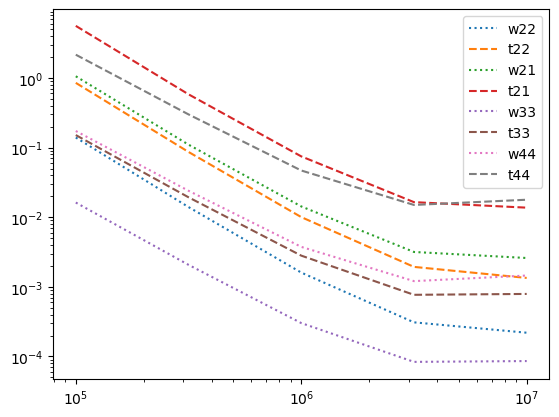

In [10]:
rd_M = np.logspace(5,7,5)
error_w1_cb = []
error_w2_cb = []
error_w3_cb = []
error_w4_cb = []

error_t1_cb = []
error_t2_cb = []
error_t3_cb = []
error_t4_cb = []
for nn in range(len(rd_M)):
    #cbgp就是没有gap的联合观测
    result = fh.cbgp_fisher(rd_M[nn],2,1)
    error_w1_cb.append(result[0])
    error_w2_cb.append(result[1])
    error_w3_cb.append(result[2])
    error_w4_cb.append(result[3])
    error_t1_cb.append(result[2])
    error_t2_cb.append(result[3])
    error_t3_cb.append(result[6])
    error_t4_cb.append(result[7])


error_w1_cb = np.array(error_w1_cb)
error_w2_cb = np.array(error_w2_cb)
error_w3_cb = np.array(error_w3_cb)
error_w4_cb = np.array(error_w4_cb)
error_t1_cb = np.array(error_t1_cb)
error_t2_cb = np.array(error_t2_cb)
error_t3_cb = np.array(error_t3_cb)
error_t4_cb = np.array(error_t4_cb)

plt.plot(rd_M,error_w1_gp,label = 'w22',linestyle=':')
plt.plot(rd_M,error_t1_gp,label = 't22',linestyle='--')
plt.plot(rd_M,error_w2_gp,label = 'w21',linestyle=':')
plt.plot(rd_M,error_t2_gp,label = 't21',linestyle='--')
plt.plot(rd_M,error_w3_gp,label = 'w33',linestyle=':')
plt.plot(rd_M,error_t3_gp,label = 't33',linestyle='--')
plt.plot(rd_M,error_w4_gp,label = 'w44',linestyle=':')
plt.plot(rd_M,error_t4_gp,label = 't44',linestyle='--')
plt.xscale('log')
plt.yscale('log')
plt.legend()
plt.show()

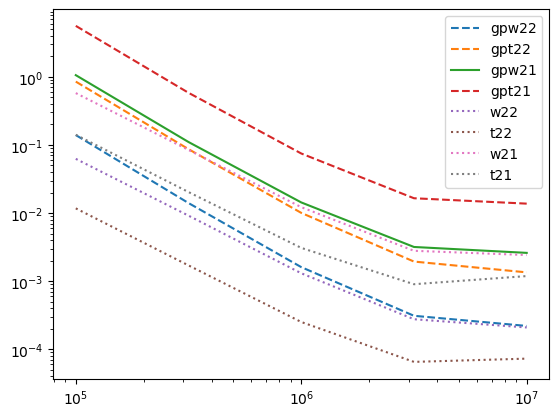

In [12]:
plt.plot(rd_M,error_w1_gp,label = 'gpw22',linestyle='--')
plt.plot(rd_M,error_t1_gp,label = 'gpt22',linestyle='--')
plt.plot(rd_M,error_w2_gp,label = 'gpw21',linestyle='-')
plt.plot(rd_M,error_t2_gp,label = 'gpt21',linestyle='--')
#plt.plot(rd_M,error_w3_gp,label = 'w33',linestyle=':')
#plt.plot(rd_M,error_t3_gp,label = 't33',linestyle='--')
#plt.plot(rd_M,error_w4_gp,label = 'w44',linestyle=':')
#plt.plot(rd_M,error_t4_gp,label = 't44',linestyle='--')

plt.plot(rd_M,error_w1_cb,label = 'w22',linestyle=':')
plt.plot(rd_M,error_t1_cb,label = 't22',linestyle=':')
plt.plot(rd_M,error_w2_cb,label = 'w21',linestyle=':')
plt.plot(rd_M,error_t2_cb,label = 't21',linestyle=':')
#plt.plot(rd_M,error_w3_gp,label = 'w33',linestyle=':')
#plt.plot(rd_M,error_t3_gp,label = 't33',linestyle='--')
#plt.plot(rd_M,error_w4_gp,label = 'w44',linestyle=':')
#plt.plot(rd_M,error_t4_gp,label = 't44',linestyle='--')

plt.xscale('log')
plt.yscale('log')
plt.legend()
plt.show()

In [13]:
randnum = .15
def gptq_fisher(Mtotw,M_ratiow,R_shiftw):
   

   delta_w = [0,0,0,0]
   delta_tau = [0,0,0,0]

   f_ini = fin(Mtotw,M_ratiow)
   f_end = fout(Mtotw,M_ratiow)
   freq = np.arange(1e-5,1,1e-5)
   freq_rd = np.arange(f_ini,f_end,1e-5)

   para_dtau = delta_tau
   params_1_p = [Mtotw,M_ratiow,R_shiftw]
   params_1_m = [Mtotw,M_ratiow,R_shiftw]
   mode_delta = 1e-3   #懒得改了，这里所有的delta都用22表示把
   omega = delta_w[:]
   omega[0] = omega[0]+mode_delta
   delta_w22_p = omega
   omega = delta_w[:]
   omega[0] = omega[0]-mode_delta
   delta_w22_m = omega
   deriv_w22 = (np.array(get_gap_sf(freq,params_1_p,delta_w22_p,para_dtau)[2]) - np.array(get_gap_sf(freq,params_1_m,delta_w22_m,para_dtau)[2]))/(2* mode_delta)


   mode_delta = 1e-3   #懒得改了，这里所有的delta都用22表示把
   omega = delta_w[:]
   omega[1] = omega[1]+mode_delta
   delta_w22_p = omega
   omega = delta_w[:]
   omega[1] = omega[1]-mode_delta
   delta_w22_m = omega
   deriv_w21 = (np.array(get_gap_sf(freq,params_1_p,delta_w22_p,para_dtau)[2]) - np.array(get_gap_sf(freq,params_1_m,delta_w22_m,para_dtau)[2]))/(2* mode_delta)


   mode_delta = 1e-3   #懒得改了，这里所有的delta都用22表示把
   omega = delta_w[:]
   omega[2] = omega[2]+mode_delta
   delta_w22_p = omega
   omega = delta_w[:]
   omega[2] = omega[2]-mode_delta
   delta_w22_m = omega
   deriv_w33 = (np.array(get_gap_sf(freq,params_1_p,delta_w22_p,para_dtau)[2]) - np.array(get_gap_sf(freq,params_1_m,delta_w22_m,para_dtau)[2]))/(2* mode_delta)

   mode_delta = 1e-3   #懒得改了，这里所有的delta都用22表示把
   omega = delta_w[:]
   omega[3] = omega[3]+mode_delta
   delta_w22_p = omega
   omega = delta_w[:]
   omega[3] = omega[3]-mode_delta
   delta_w22_m = omega
   deriv_w44 = (np.array(get_gap_sf(freq,params_1_p,delta_w22_p,para_dtau)[2]) - np.array(get_gap_sf(freq,params_1_m,delta_w22_m,para_dtau)[2]))/(2* mode_delta)

   #这里按顺序是tau的各模式
       #22模式的w和tau:



   mode_delta = 1e-3
   tau = delta_tau[:]
   tau[0] = tau[0]+mode_delta
   delta_tau22_p = tau
   tau = delta_tau[:]
   tau[0] = tau[0]-mode_delta
   delta_tau22_m = tau
   deriv_tau22 = (np.array(get_gap_sf(freq,params_1_p,para_dw,delta_tau22_p)[2]) - np.array(get_gap_sf(freq,params_1_m,para_dw,delta_tau22_m)[2]))/(2* mode_delta)


   #21模式的w和tau:




   mode_delta = 1e-3
   tau = delta_tau[:]
   tau[1] = tau[1]+mode_delta
   delta_tau22_p = tau
   tau = delta_tau[:]
   tau[1] = tau[1]-mode_delta
   delta_tau22_m = tau
   deriv_tau21 = (np.array(get_gap_sf(freq,params_1_p,para_dw,delta_tau22_p)[2]) - np.array(get_gap_sf(freq,params_1_m,para_dw,delta_tau22_m)[2]))/(2* mode_delta)

   #33模式的w和tau:



   mode_delta = 1e-3
   tau = delta_tau[:]
   tau[2] = tau[2]+mode_delta
   delta_tau22_p = tau
   tau = delta_tau[:]
   tau[2] = tau[2]-mode_delta
   delta_tau22_m = tau
   deriv_tau33 = (np.array(get_gap_sf(freq,params_1_p,para_dw,delta_tau22_p)[2]) - np.array(get_gap_sf(freq,params_1_m,para_dw,delta_tau22_m)[2]))/(2* mode_delta)

   #44模式的w和tau:



   mode_delta = 1e-3
   tau = delta_tau[:]
   tau[3] = tau[3]+mode_delta
   delta_tau22_p = tau
   tau = delta_tau[:]
   tau[3] = tau[3]-mode_delta
   delta_tau22_m = tau
   deriv_tau44 = (np.array(get_gap_sf(freq,params_1_p,para_dw,delta_tau22_p)[2]) - np.array(get_gap_sf(freq,params_1_m,para_dw,delta_tau22_m)[2]))/(2* mode_delta)



   freq_rd = np.array(get_gap_sf(freq,params_1_p,para_dw,delta_tau22_p)[0])



   diff_vec = [deriv_w22,deriv_w21,deriv_w33,deriv_w44,deriv_tau22,deriv_tau21,deriv_tau33,deriv_tau44]  # Concatenate derivatives

   N_sig = 1  # Number of signals

   N_params = len(diff_vec)  # Number of parameters we care about

   K = N_sig * N_params  # Dimension of Fisher Matrix

   fish_mix = np.eye(K)
   for i in range(0,K):
      for j in range(0,K):
         fish_mix[i,j] = inner_prod(diff_vec[i],diff_vec[j],PowerSpectralDensity(freq_rd),1e-5)  # Construct Fisher Matrix
         
         

   import mpmath as mp  # Import arbitrary precision matrix
   #mp.dps表示精确度达到的位数
   mp.dps = 4000;   
   #print(fish_mix)
   fish_mix_prec = mp.matrix(fish_mix)
   #print(fish_mix_prec)
   fish_mix_inv = fish_mix_prec**-1
   #print(fish_mix_inv)

   #将这三行向量合成为一个矩阵
   Cov_Matrix = np.eye(K)
   for i in range(0,K):
      for j in range(0,K):
         Cov_Matrix[i,j] = float(fish_mix_inv[i,j])
   print(Cov_Matrix)
   print('Delta logMchirp optimal:',np.sqrt(np.diag(Cov_Matrix))[0])
   print('Delta eta optimal:',np.sqrt(np.diag(Cov_Matrix))[1])
   print('Delta beta optimal:',np.sqrt(np.diag(Cov_Matrix))[2])
   print('Delta beta optimal:',np.sqrt(np.diag(Cov_Matrix))[3])
   return np.sqrt(np.diag(Cov_Matrix))[0],np.sqrt(np.diag(Cov_Matrix))[1],np.sqrt(np.diag(Cov_Matrix))[2],np.sqrt(np.diag(Cov_Matrix))[3],\
   np.sqrt(np.diag(Cov_Matrix))[4],np.sqrt(np.diag(Cov_Matrix))[5],np.sqrt(np.diag(Cov_Matrix))[6],np.sqrt(np.diag(Cov_Matrix))[7]

In [14]:
#这里是只有quasi normal mode的计算模块
rd_M = np.logspace(5,7,5)
error_w1_gptq = []
error_w2_gptq = []
error_w3_gptq = []
error_w4_gptq = []

error_t1_gptq = []
error_t2_gptq = []
error_t3_gptq = []
error_t4_gptq = []
for nn in range(len(rd_M)):
    result = gptq_fisher(rd_M[nn],2,1)
    error_w1_gptq.append(result[0])
    error_w2_gptq.append(result[1])
    error_w3_gptq.append(result[2])
    error_w4_gptq.append(result[3])
    error_t1_gptq.append(result[4])
    error_t2_gptq.append(result[5])
    error_t3_gptq.append(result[6])
    error_t4_gptq.append(result[7])


error_w1_gptq = np.array(error_w1_gptq)
error_w2_gptq = np.array(error_w2_gptq)
error_w3_gptq = np.array(error_w3_gptq)
error_w4_gptq = np.array(error_w4_gptq)
error_t1_gptq = np.array(error_t1_gptq)
error_t2_gptq = np.array(error_t2_gptq)
error_t3_gptq = np.array(error_t3_gptq)
error_t4_gptq = np.array(error_t4_gptq)

完成加窗过程，窗的长度为： 11.917305488756295
[7182, 7183, 7184, 7185, 7186, 7187, 7188, 7189, 7190, 7191, 7192, 7193, 7194, 7195, 7196, 7197, 7198, 7199, 7200, 7201, 7202, 7203, 7204, 7205, 7206, 7207, 7208, 7209, 7210, 7211, 7212, 7213, 7214, 7215, 7216, 7217, 7218, 7219, 7220, 7221, 7222, 7223, 7224, 7225, 7226, 7227, 7228, 7229, 7230, 7231, 7232, 7233, 7234, 7235, 7236, 7237, 7238, 7239, 7240, 7241, 7242, 7243, 7244, 7245, 7246, 7247, 7248, 7249, 7250, 7251, 7252, 7253, 7254, 7255, 7256, 7257, 7258, 7259, 7260, 7261, 7262, 7263, 7264, 7265, 7266, 7267, 7268, 7269, 7270, 7271, 7272, 7273, 7274, 7275, 7276, 7277, 7278, 7279, 7280, 7281, 7282, 7283, 7284, 7285, 7286, 7287, 7288, 7289, 7290, 7291, 7292, 7293, 7294, 7295, 7296, 7297, 7298, 7299, 7300, 7301, 7302, 7303, 7304, 7305, 7306, 7307, 7308, 7309, 7310, 7311, 7312, 7313, 7314, 7315, 7316, 7317, 7318, 7319, 7320, 7321, 7322, 7323, 7324, 7325, 7326, 7327, 7328, 7329, 7330, 7331, 7332, 7333, 7334, 7335, 7336, 7337, 7338, 7339, 7340, 7341, 7342, 

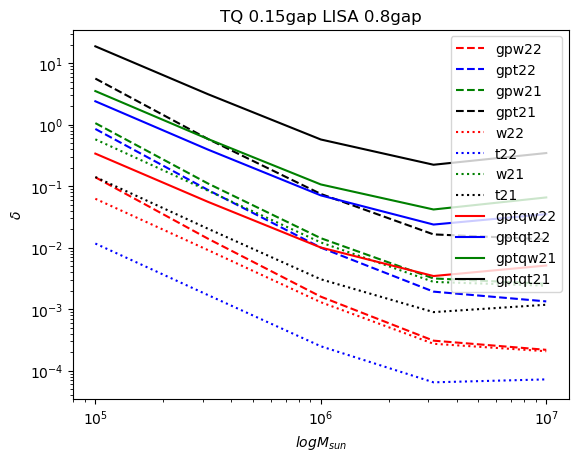

In [16]:
plt.plot(rd_M,error_w1_gp,label = 'gpw22',linestyle='--',color = 'red')
plt.plot(rd_M,error_t1_gp,label = 'gpt22',linestyle='--',color = 'blue')
plt.plot(rd_M,error_w2_gp,label = 'gpw21',linestyle='--',color = 'green')
plt.plot(rd_M,error_t2_gp,label = 'gpt21',linestyle='--',color = 'black')
#plt.plot(rd_M,error_w3_gp,label = 'w33',linestyle=':')
#plt.plot(rd_M,error_t3_gp,label = 't33',linestyle='--')
#plt.plot(rd_M,error_w4_gp,label = 'w44',linestyle=':')
#plt.plot(rd_M,error_t4_gp,label = 't44',linestyle='--')

plt.plot(rd_M,error_w1_cb,label = 'w22',linestyle=':',color = 'red')
plt.plot(rd_M,error_t1_cb,label = 't22',linestyle=':',color = 'blue')
plt.plot(rd_M,error_w2_cb,label = 'w21',linestyle=':',color = 'green')
plt.plot(rd_M,error_t2_cb,label = 't21',linestyle=':',color = 'black')
#plt.plot(rd_M,error_w3_gp,label = 'w33',linestyle=':')
#plt.plot(rd_M,error_t3_gp,label = 't33',linestyle='--')
#plt.plot(rd_M,error_w4_gp,label = 'w44',linestyle=':')
#plt.plot(rd_M,error_t4_gp,label = 't44',linestyle='--')

plt.plot(rd_M,error_w1_gptq,label = 'gptqw22',linestyle='-',color = 'red')
plt.plot(rd_M,error_t1_gptq,label = 'gptqt22',linestyle='-',color = 'blue')
plt.plot(rd_M,error_w2_gptq,label = 'gptqw21',linestyle='-',color = 'green')
plt.plot(rd_M,error_t2_gptq,label = 'gptqt21',linestyle='-',color = 'black')
plt.xlabel('$log M_{sun}$')
plt.ylabel('$\delta$')
plt.title('TQ 0.15gap LISA 0.8gap')
plt.xscale('log')
plt.yscale('log')
plt.legend()
plt.show()

In [20]:
#这里是只有quasi normal mode的计算模块
rd_M = np.logspace(5,7,5)
error_w1_gpi = []
error_w2_gpi = []
error_w3_gpi = []
error_w4_gpi = []

error_t1_gpi = []
error_t2_gpi = []
error_t3_gpi = []
error_t4_gpi = []
for nn in range(len(rd_M)):
   Mtotw = rd_M[nn]
   M_ratiow = 2
   R_shiftw = 1
   
   randnum = .8
   delta_w = [0,0,0,0]
   delta_tau = [0,0,0,0]
   para_dw = delta_w
   f_ini = fin(Mtotw,M_ratiow)
   f_end = fout(Mtotw,M_ratiow)
   freq = np.arange(1e-5,1,1e-5)
   freq_rd = np.arange(f_ini,f_end,1e-5)

   para_dtau = delta_tau
   params_1_p = [Mtotw,M_ratiow,R_shiftw]
   params_1_m = [Mtotw,M_ratiow,R_shiftw]
   mode_delta = 1e-3   #懒得改了，这里所有的delta都用22表示把
   omega = delta_w[:]
   omega[0] = omega[0]+mode_delta
   delta_w22_p = omega
   omega = delta_w[:]
   omega[0] = omega[0]-mode_delta
   delta_w22_m = omega
   deriv_w22 = (np.array(get_gap_sf(freq,params_1_p,delta_w22_p,para_dtau)[2]) - np.array(get_gap_sf(freq,params_1_m,delta_w22_m,para_dtau)[2]))/(2* mode_delta)


   mode_delta = 1e-3   #懒得改了，这里所有的delta都用22表示把
   omega = delta_w[:]
   omega[1] = omega[1]+mode_delta
   delta_w22_p = omega
   omega = delta_w[:]
   omega[1] = omega[1]-mode_delta
   delta_w22_m = omega
   deriv_w21 = (np.array(get_gap_sf(freq,params_1_p,delta_w22_p,para_dtau)[2]) - np.array(get_gap_sf(freq,params_1_m,delta_w22_m,para_dtau)[2]))/(2* mode_delta)


   mode_delta = 1e-3   #懒得改了，这里所有的delta都用22表示把
   omega = delta_w[:]
   omega[2] = omega[2]+mode_delta
   delta_w22_p = omega
   omega = delta_w[:]
   omega[2] = omega[2]-mode_delta
   delta_w22_m = omega
   deriv_w33 = (np.array(get_gap_sf(freq,params_1_p,delta_w22_p,para_dtau)[2]) - np.array(get_gap_sf(freq,params_1_m,delta_w22_m,para_dtau)[2]))/(2* mode_delta)

   mode_delta = 1e-3   #懒得改了，这里所有的delta都用22表示把
   omega = delta_w[:]
   omega[3] = omega[3]+mode_delta
   delta_w22_p = omega
   omega = delta_w[:]
   omega[3] = omega[3]-mode_delta
   delta_w22_m = omega
   deriv_w44 = (np.array(get_gap_sf(freq,params_1_p,delta_w22_p,para_dtau)[2]) - np.array(get_gap_sf(freq,params_1_m,delta_w22_m,para_dtau)[2]))/(2* mode_delta)

   #这里按顺序是tau的各模式
       #22模式的w和tau:



   mode_delta = 1e-3
   tau = delta_tau[:]
   tau[0] = tau[0]+mode_delta
   delta_tau22_p = tau
   tau = delta_tau[:]
   tau[0] = tau[0]-mode_delta
   delta_tau22_m = tau
   deriv_tau22 = (np.array(get_gap_sf(freq,params_1_p,para_dw,delta_tau22_p)[2]) - np.array(get_gap_sf(freq,params_1_m,para_dw,delta_tau22_m)[2]))/(2* mode_delta)


   #21模式的w和tau:




   mode_delta = 1e-3
   tau = delta_tau[:]
   tau[1] = tau[1]+mode_delta
   delta_tau22_p = tau
   tau = delta_tau[:]
   tau[1] = tau[1]-mode_delta
   delta_tau22_m = tau
   deriv_tau21 = (np.array(get_gap_sf(freq,params_1_p,para_dw,delta_tau22_p)[2]) - np.array(get_gap_sf(freq,params_1_m,para_dw,delta_tau22_m)[2]))/(2* mode_delta)

   #33模式的w和tau:



   mode_delta = 1e-3
   tau = delta_tau[:]
   tau[2] = tau[2]+mode_delta
   delta_tau22_p = tau
   tau = delta_tau[:]
   tau[2] = tau[2]-mode_delta
   delta_tau22_m = tau
   deriv_tau33 = (np.array(get_gap_sf(freq,params_1_p,para_dw,delta_tau22_p)[2]) - np.array(get_gap_sf(freq,params_1_m,para_dw,delta_tau22_m)[2]))/(2* mode_delta)

   #44模式的w和tau:



   mode_delta = 1e-3
   tau = delta_tau[:]
   tau[3] = tau[3]+mode_delta
   delta_tau22_p = tau
   tau = delta_tau[:]
   tau[3] = tau[3]-mode_delta
   delta_tau22_m = tau
   deriv_tau44 = (np.array(get_gap_sf(freq,params_1_p,para_dw,delta_tau22_p)[2]) - np.array(get_gap_sf(freq,params_1_m,para_dw,delta_tau22_m)[2]))/(2* mode_delta)



   freq_rd = np.array(get_gap_sf(freq,params_1_p,para_dw,delta_tau22_p)[0])



   diff_vec_tq = [deriv_w22,deriv_w21,deriv_w33,deriv_w44,deriv_tau22,deriv_tau21,deriv_tau33,deriv_tau44]  # Concatenate derivatives

   N_sig = 1  # Number of signals

   N_params = len(diff_vec_tq)  # Number of parameters we care about

   K = N_sig * N_params  # Dimension of Fisher Matrix

   fish_mix_tq = np.eye(K)
   for i in range(0,K):
      for j in range(0,K):
         fish_mix_tq[i,j] = inner_prod(diff_vec_tq[i],diff_vec_tq[j],PowerSpectralDensity(freq_rd),1e-5)  # Construct Fisher Matrix


   randnum = .15
   delta_w = [0,0,0,0]
   delta_tau = [0,0,0,0]
   para_dw = delta_w
   f_ini = fin(Mtotw,M_ratiow)
   f_end = fout(Mtotw,M_ratiow)
   freq = np.arange(1e-5,1,1e-5)
   freq_rd = np.arange(f_ini,f_end,1e-5)

   para_dtau = delta_tau
   params_1_p = [Mtotw,M_ratiow,R_shiftw]
   params_1_m = [Mtotw,M_ratiow,R_shiftw]
   mode_delta = 1e-3   #懒得改了，这里所有的delta都用22表示把
   omega = delta_w[:]
   omega[0] = omega[0]+mode_delta
   delta_w22_p = omega
   omega = delta_w[:]
   omega[0] = omega[0]-mode_delta
   delta_w22_m = omega
   deriv_w22 = (np.array(get_gap_sf(freq,params_1_p,delta_w22_p,para_dtau)[2]) - np.array(get_gap_sf(freq,params_1_m,delta_w22_m,para_dtau)[2]))/(2* mode_delta)


   mode_delta = 1e-3   #懒得改了，这里所有的delta都用22表示把
   omega = delta_w[:]
   omega[1] = omega[1]+mode_delta
   delta_w22_p = omega
   omega = delta_w[:]
   omega[1] = omega[1]-mode_delta
   delta_w22_m = omega
   deriv_w21 = (np.array(get_gap_sf(freq,params_1_p,delta_w22_p,para_dtau)[2]) - np.array(get_gap_sf(freq,params_1_m,delta_w22_m,para_dtau)[2]))/(2* mode_delta)


   mode_delta = 1e-3   #懒得改了，这里所有的delta都用22表示把
   omega = delta_w[:]
   omega[2] = omega[2]+mode_delta
   delta_w22_p = omega
   omega = delta_w[:]
   omega[2] = omega[2]-mode_delta
   delta_w22_m = omega
   deriv_w33 = (np.array(get_gap_sf(freq,params_1_p,delta_w22_p,para_dtau)[2]) - np.array(get_gap_sf(freq,params_1_m,delta_w22_m,para_dtau)[2]))/(2* mode_delta)

   mode_delta = 1e-3   #懒得改了，这里所有的delta都用22表示把
   omega = delta_w[:]
   omega[3] = omega[3]+mode_delta
   delta_w22_p = omega
   omega = delta_w[:]
   omega[3] = omega[3]-mode_delta
   delta_w22_m = omega
   deriv_w44 = (np.array(get_gap_sf(freq,params_1_p,delta_w22_p,para_dtau)[2]) - np.array(get_gap_sf(freq,params_1_m,delta_w22_m,para_dtau)[2]))/(2* mode_delta)

   #这里按顺序是tau的各模式
       #22模式的w和tau:



   mode_delta = 1e-3
   tau = delta_tau[:]
   tau[0] = tau[0]+mode_delta
   delta_tau22_p = tau
   tau = delta_tau[:]
   tau[0] = tau[0]-mode_delta
   delta_tau22_m = tau
   deriv_tau22 = (np.array(get_gap_sf(freq,params_1_p,para_dw,delta_tau22_p)[2]) - np.array(get_gap_sf(freq,params_1_m,para_dw,delta_tau22_m)[2]))/(2* mode_delta)


   #21模式的w和tau:




   mode_delta = 1e-3
   tau = delta_tau[:]
   tau[1] = tau[1]+mode_delta
   delta_tau22_p = tau
   tau = delta_tau[:]
   tau[1] = tau[1]-mode_delta
   delta_tau22_m = tau
   deriv_tau21 = (np.array(get_gap_sf(freq,params_1_p,para_dw,delta_tau22_p)[2]) - np.array(get_gap_sf(freq,params_1_m,para_dw,delta_tau22_m)[2]))/(2* mode_delta)

   #33模式的w和tau:



   mode_delta = 1e-3
   tau = delta_tau[:]
   tau[2] = tau[2]+mode_delta
   delta_tau22_p = tau
   tau = delta_tau[:]
   tau[2] = tau[2]-mode_delta
   delta_tau22_m = tau
   deriv_tau33 = (np.array(get_gap_sf(freq,params_1_p,para_dw,delta_tau22_p)[2]) - np.array(get_gap_sf(freq,params_1_m,para_dw,delta_tau22_m)[2]))/(2* mode_delta)

   #44模式的w和tau:



   mode_delta = 1e-3
   tau = delta_tau[:]
   tau[3] = tau[3]+mode_delta
   delta_tau22_p = tau
   tau = delta_tau[:]
   tau[3] = tau[3]-mode_delta
   delta_tau22_m = tau
   deriv_tau44 = (np.array(get_gap_sf(freq,params_1_p,para_dw,delta_tau22_p)[2]) - np.array(get_gap_sf(freq,params_1_m,para_dw,delta_tau22_m)[2]))/(2* mode_delta)



   freq_rd = np.array(get_gap_sf(freq,params_1_p,para_dw,delta_tau22_p)[0])



   diff_vec_ls = [deriv_w22,deriv_w21,deriv_w33,deriv_w44,deriv_tau22,deriv_tau21,deriv_tau33,deriv_tau44]  # Concatenate derivatives

   N_sig = 1  # Number of signals

   N_params = len(diff_vec_ls)  # Number of parameters we care about

   K = N_sig * N_params  # Dimension of Fisher Matrix

   fish_mix_ls = np.eye(K)
   for i in range(0,K):
      for j in range(0,K):
         fish_mix_ls[i,j] = inner_prod(diff_vec_ls[i],diff_vec_ls[j],fh.psd_ls(freq_rd),1e-5)  # Construct Fisher Matrix



         

   import mpmath as mp  # Import arbitrary precision matrix
   #mp.dps表示精确度达到的位数
   mp.dps = 4000;   
   #print(fish_mix)
   fish_mix_prec = mp.matrix(fish_mix_tq)+mp.matrix(fish_mix_ls)
   #print(fish_mix_prec)
   fish_mix_inv = fish_mix_prec**-1
   #print(fish_mix_inv)

   #将这三行向量合成为一个矩阵
   Cov_Matrix = np.eye(K)
   for i in range(0,K):
      for j in range(0,K):
         Cov_Matrix[i,j] = float(fish_mix_inv[i,j])

    



   result = [np.sqrt(np.diag(Cov_Matrix))[0],np.sqrt(np.diag(Cov_Matrix))[1],np.sqrt(np.diag(Cov_Matrix))[2],np.sqrt(np.diag(Cov_Matrix))[3],np.sqrt(np.diag(Cov_Matrix))[4],np.sqrt(np.diag(Cov_Matrix))[5],np.sqrt(np.diag(Cov_Matrix))[6],np.sqrt(np.diag(Cov_Matrix))[7]]
   error_w1_gpi.append(result[0])
   error_w2_gpi.append(result[1])
   error_w3_gpi.append(result[2])
   error_w4_gpi.append(result[3])
   error_t1_gpi.append(result[4])
   error_t2_gpi.append(result[5])
   error_t3_gpi.append(result[6])
   error_t4_gpi.append(result[7])
   cycle = nn+1
   print('已计算轮数：',cycle)


error_w1_gpi = np.array(error_w1_gpi)
error_w2_gpi = np.array(error_w2_gpi)
error_w3_gpi = np.array(error_w3_gpi)
error_w4_gpi = np.array(error_w4_gpi)
error_t1_gpi = np.array(error_t1_gpi)
error_t2_gpi = np.array(error_t2_gpi)
error_t3_gpi = np.array(error_t3_gpi)
error_t4_gpi = np.array(error_t4_gpi)

完成加窗过程，窗的长度为： 11.917305488756295
[7182, 7183, 7184, 7185, 7186, 7187, 7188, 7189, 7190, 7191, 7192, 7193, 7194, 7195, 7196, 7197, 7198, 7199, 7200, 7201, 7202, 7203, 7204, 7205, 7206, 7207, 7208, 7209, 7210, 7211, 7212, 7213, 7214, 7215, 7216, 7217, 7218, 7219, 7220, 7221, 7222, 7223, 7224, 7225, 7226, 7227, 7228, 7229, 7230, 7231, 7232, 7233, 7234, 7235, 7236, 7237, 7238, 7239, 7240, 7241, 7242, 7243, 7244, 7245, 7246, 7247, 7248, 7249, 7250, 7251, 7252, 7253, 7254, 7255, 7256, 7257, 7258, 7259, 7260, 7261, 7262, 7263, 7264, 7265, 7266, 7267, 7268, 7269, 7270, 7271, 7272, 7273, 7274, 7275, 7276, 7277, 7278, 7279, 7280, 7281, 7282, 7283, 7284, 7285, 7286, 7287, 7288, 7289, 7290, 7291, 7292, 7293, 7294, 7295, 7296, 7297, 7298, 7299, 7300, 7301, 7302, 7303, 7304, 7305, 7306, 7307, 7308, 7309, 7310, 7311, 7312, 7313, 7314, 7315, 7316, 7317, 7318, 7319, 7320, 7321, 7322, 7323, 7324, 7325, 7326, 7327, 7328, 7329, 7330, 7331, 7332, 7333, 7334, 7335, 7336, 7337, 7338, 7339, 7340, 7341, 7342, 

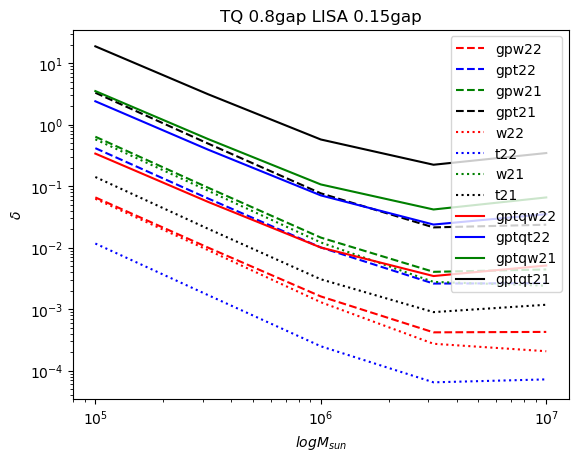

In [21]:
plt.plot(rd_M,error_w1_gpi,label = 'gpw22',linestyle='--',color = 'red')
plt.plot(rd_M,error_t1_gpi,label = 'gpt22',linestyle='--',color = 'blue')
plt.plot(rd_M,error_w2_gpi,label = 'gpw21',linestyle='--',color = 'green')
plt.plot(rd_M,error_t2_gpi,label = 'gpt21',linestyle='--',color = 'black')
#plt.plot(rd_M,error_w3_gp,label = 'w33',linestyle=':')
#plt.plot(rd_M,error_t3_gp,label = 't33',linestyle='--')
#plt.plot(rd_M,error_w4_gp,label = 'w44',linestyle=':')
#plt.plot(rd_M,error_t4_gp,label = 't44',linestyle='--')

plt.plot(rd_M,error_w1_cb,label = 'w22',linestyle=':',color = 'red')
plt.plot(rd_M,error_t1_cb,label = 't22',linestyle=':',color = 'blue')
plt.plot(rd_M,error_w2_cb,label = 'w21',linestyle=':',color = 'green')
plt.plot(rd_M,error_t2_cb,label = 't21',linestyle=':',color = 'black')
#plt.plot(rd_M,error_w3_gp,label = 'w33',linestyle=':')
#plt.plot(rd_M,error_t3_gp,label = 't33',linestyle='--')
#plt.plot(rd_M,error_w4_gp,label = 'w44',linestyle=':')
#plt.plot(rd_M,error_t4_gp,label = 't44',linestyle='--')

plt.plot(rd_M,error_w1_gptq,label = 'gptqw22',linestyle='-',color = 'red')
plt.plot(rd_M,error_t1_gptq,label = 'gptqt22',linestyle='-',color = 'blue')
plt.plot(rd_M,error_w2_gptq,label = 'gptqw21',linestyle='-',color = 'green')
plt.plot(rd_M,error_t2_gptq,label = 'gptqt21',linestyle='-',color = 'black')
plt.xlabel('$log M_{sun}$')
plt.ylabel('$\delta$')
plt.title('TQ 0.8gap LISA 0.15gap')
plt.xscale('log')
plt.yscale('log')
plt.legend()
plt.show()